# Import data

In [1]:
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns

In [2]:
values = pd.read_csv('csv_files/training_set_values.csv')
labels = pd.read_csv('csv_files/training_set_labels.csv')

In [3]:
df = pd.merge(values, labels, on = 'id')

In [4]:
df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


# Mapping the data

In [41]:
import plotly.express as px

fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="id", hover_data=["status_group"], 
                        color = 'status_group', size='population', zoom=5 , height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

fig.show()

# Funder

In [6]:
df.funder.value_counts()[:3]

Government Of Tanzania    9084
Danida                    3114
Hesawa                    2202
Name: funder, dtype: int64

In [7]:
f1 = df[df['funder'] == 'Government Of Tanzania']

In [8]:
f2 = df[df['funder'] == 'Danida']

In [9]:
f3 = df[df['funder'] == 'Hesawa']

In [10]:
funder = pd.concat([f1,f2,f3])

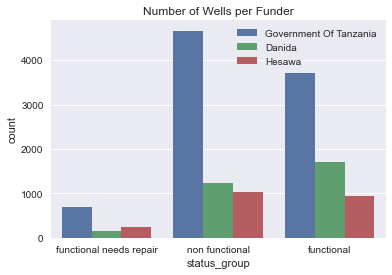

In [33]:
sns.countplot(x='status_group', data=funder, hue = 'funder')
plt.title('Number of Wells per Funder')
plt.legend(loc='best');

# Installer

In [12]:
df.installer.value_counts()[:3]

DWE           17402
Government     1825
RWE            1206
Name: installer, dtype: int64

In [13]:
i1 = df[df['installer'] == 'DWE']
i2 = df[df['installer'] == 'Government']
i3 = df[df['installer'] == 'RWE']

In [14]:
installer = pd.concat([i1,i2,i3])

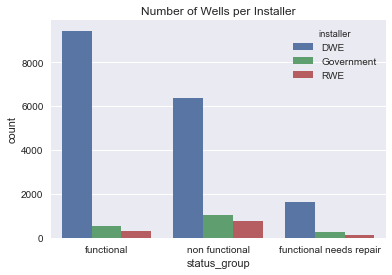

In [34]:
sns.countplot(x='status_group', data=installer, hue= 'installer')
plt.title('Number of Wells per Installer');

# Management

In [16]:
df.scheme_management.value_counts()[:3]

VWC                36793
WUG                 5206
Water authority     3153
Name: scheme_management, dtype: int64

In [17]:
m1 = df[df['scheme_management'] == 'VWC']
m2 = df[df['scheme_management'] == 'WUG']
m3 = df[df['scheme_management'] == 'Water authority']

In [18]:
management = pd.concat([m1,m2,m3])

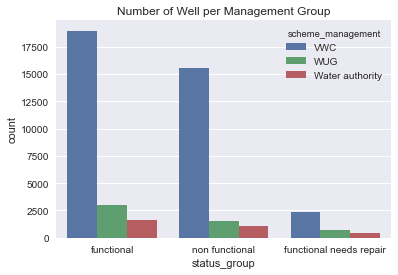

In [35]:
sns.countplot(x='status_group', hue='scheme_management', data=management)
plt.title("Number of Well per Management Group");

# GPS Height

In [20]:
gb = df.groupby('status_group')
gb.mean()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
status_group,,,,,,,,,,
functional,37036.753154,461.798235,740.131188,34.242071,-5.704921,0.539012,13.616417,5.134660,187.553303,1345.567718
functional needs repair,37151.263609,267.071577,627.607135,31.242086,-5.162580,0.307621,15.443595,4.759092,175.102154,1168.406764
non functional,37219.076498,123.481230,574.464774,34.381006,-5.810394,0.413950,17.644585,6.494173,170.016430,1262.183491


In [21]:
mean = gb.mean()
mean.reset_index(inplace=True)

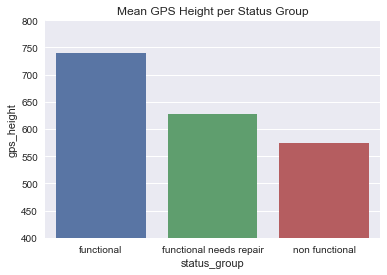

In [36]:
sns.barplot(x='status_group', y= 'gps_height', data=mean)
plt.ylim(400,800)
plt.title('Mean GPS Height per Status Group');

# amount_tsh

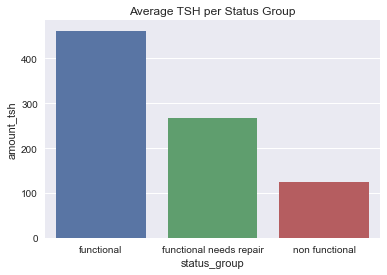

In [23]:
sns.barplot(x='status_group', y= 'amount_tsh', data= mean)
plt.title('Average TSH per Status Group');